In [399]:
import os
import pandas as pd
import matplotlib as mpl
from matplotlib import pyplot as plt
import numpy as np
from scipy.sparse import csr_matrix
from scipy import stats
import umap

import anndata as ad
import scanpy as sc
import squidpy as sq
import seaborn as sns
import h5py
from matplotlib_scalebar.scalebar import ScaleBar
from tqdm import tqdm

# mpl.rcParams.update(mpl.rcParamsDefault) #Reset rcParams to default
# colors = plt.rcParams['axes.prop_cycle'].by_key()['color']  # Colors in this style

# # Plotting style function (run this before plotting the final figure)
def set_plotting_style():
    plt.style.use('seaborn-paper')
    plt.rc('axes', labelsize=12)
    plt.rc('axes', titlesize=12)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.rc('legend', fontsize=10)
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('xtick.major', pad=2)
    plt.rc('ytick.major', pad=2)
    plt.rc('mathtext', fontset='stixsans', sf='sansserif')
    plt.rc('figure', figsize=[10,9])
    plt.rc('svg', fonttype='none')

In [400]:
#Define the path where the files are located
DATA_PATH=('/mnt/ibm_lg/leah.dorman/Nanostring/Data/IBD_Michael_Kattah/')
data_files = os.listdir(os.path.join(DATA_PATH,'annotated_data'))
data_files


['full_dataset_with_celltypes.h5ad',
 'renormalized_10-11-2022.h5ad',
 'KNFC5VYF',
 'umap.h5ad',
 '22_10_4_CosMx_umap_V5.h5ad']

In [401]:
#load in data file
datafile = data_files[1]
ndata = sc.read_h5ad(os.path.join(DATA_PATH,'annotated_data',datafile))
ndata

AnnData object with n_obs × n_vars = 64699 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ercc', 'pct_counts_ercc', 'n_genes', 'Endoscopic_severity', 'R_vs_L', 'leiden_v10_r1.6', 'Patient_samples', 'leiden_v8_r1.6', 'fine_annotation', 'Coarse_annotation', 'leiden_v9_r0.4', 'Condition'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ercc', 'n_cells', 'mean', 'std'
    uns: 'Coarse_annotation_colors', 'fov_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_spatial', 'X_spatial_global', 'X_umap', 'spatial', 'spatial_fov'
    varm: 'PCs'
    layers: 'log_normalized_counts', 'raw_counts', 'scale_data'
    obsp: 'connectivitie

In [347]:
#Export total counts to a csv file
#ndata.var.total_counts.to_csv('/mnt/ibm_lg/leah.dorman/Nanostring/total_counts.csv')


In [403]:
#identify ERCC probes
negprobes = [i for i in ndata.var.index if i.startswith('Neg')]
print(len(negprobes))
ndata.var.total_counts[ndata.var.index.isin(negprobes)].mean()

19


1154.0

Text(0, 0.5, 'Number of genes')

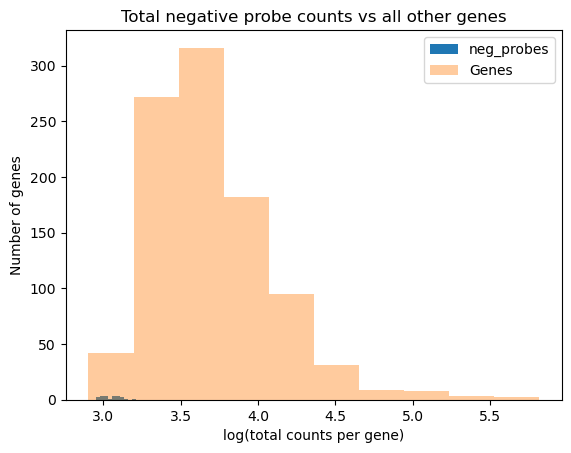

In [404]:
#add up the neg probes and all the other gene counts per cell
#plot scatter
array_neg = np.log10(ndata.var['total_counts'][ndata.var.index.isin(negprobes)])
array_pos = np.log10(ndata.var['total_counts'][~ndata.var.index.isin(negprobes)])


namedplot = 'cosmx'
fig1,namedplot=plt.subplots()
namedplot.hist(array_neg,alpha=1)
namedplot.hist(array_pos,alpha=0.4)
namedplot.legend(['neg_probes','Genes'],loc=1)

plt.xlabel('log(total counts per gene)')
plt.title('Total negative probe counts vs all other genes')
plt.ylabel('Number of genes')

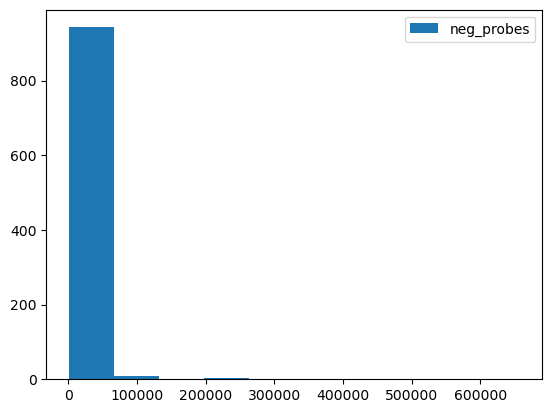

In [405]:
namedplot = 'cosmx'
fig1,namedplot=plt.subplots()
#namedplot.hist(ndata.var['total_counts'][ndata.var.index.isin(negprobes)])
namedplot.hist(ndata.var['total_counts'][~ndata.var.index.isin(negprobes)])
namedplot.legend(['neg_probes','other'],loc=1)

In [406]:
#add in some plots like Yang-Joon's with individual genes
#define some relevant genes
marker_genes = {
    'CD4_T_Cell':['CD3D', 'CD40LG', 'IL7R'],
    'B_Cell':['CD52','CD37','MS4A1'],
    'mDendritic_Cell':['CLEC7A','CLEC10A'],
    'Endothelial':['KDR','RAMP3','VWF','PECAM1'],
    'Fibroblast':['MYH11','ACTA2','ACTG2'],
    'CD8_T_Cell':['KLRK1','CCL5'],
    'Crypt_TA_Cell':['SPINK1','AGR2','OLFM4'],
    'Macrophage':['C1QC','GPNMB','C1QB'],
    'Monocyte':['ITGAX','FGR','S100A8'],
    'Epithelial':['CEACAM6','KRT19','KRT20','CEACAM1','EPCAM','PIGR','KRT8'],
    'Treg':['CTLA4','FOXP3'],
    'NK_CD8_Cell':['GZMA','ITGAE','GZMH'],
    'Inflammatory_Macrophage':['MMP9','PTGDS','CCL18'],
    'Plasma_Cell':['IRF4','JCHAIN','MZB1'],
    'Mast_Cell':['TPSB2','TPSAB1','CPA3'],
    'ILC3':['KIT'], #,'RORC'
    'Enteric_Neurons':['CRYAB','S100B','NRXN1'], #'PLP1'
}

negprobes

['NegPrb3',
 'NegPrb5',
 'NegPrb6',
 'NegPrb7',
 'NegPrb8',
 'NegPrb9',
 'NegPrb10',
 'NegPrb11',
 'NegPrb12',
 'NegPrb13',
 'NegPrb14',
 'NegPrb15',
 'NegPrb16',
 'NegPrb18',
 'NegPrb19',
 'NegPrb20',
 'NegPrb21',
 'NegPrb22',
 'NegPrb23']

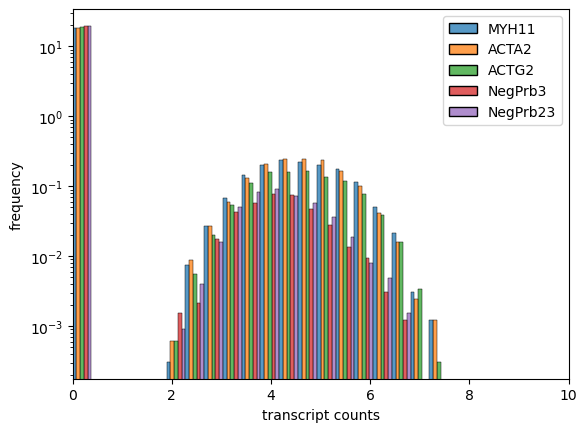

In [407]:
# Nanostring dataset
# set_plotting_style()
# plt.rc('figure', figsize=[8,6])

# convert to a dataframe for plotting
df_nanostring = pd.DataFrame(ndata.layers['log_normalized_counts'].toarray(),
                                       index = ndata.obs_names,
                                       columns = ndata.var_names)

list_markers = marker_genes['Fibroblast']+['NegPrb3','NegPrb23'] # neat1
#list_markers = markers_genes['Fibroblast']

ax = sns.histplot(df_nanostring.loc[:,list_markers], stat='percent', bins=20, multiple = 'dodge')

ax.set_xlabel('transcript counts')
ax.set_ylabel('frequency')
ax.set_xlim((0,10))
ax.set_yscale('log')
plt.show()

#scatter plot between neg probe and marker gene for each cell 

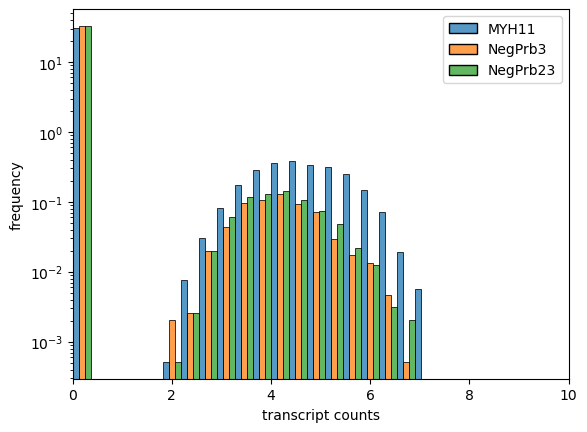

In [408]:
# Nanostring dataset
# set_plotting_style()
# plt.rc('figure', figsize=[8,6])

# convert to a dataframe for plotting
df_nanostring = pd.DataFrame(ndata.layers['log_normalized_counts'].toarray(),
                                       index = ndata.obs_names,
                                       columns = ndata.var_names)

list_markers = [marker_genes['Fibroblast'][0],'NegPrb3','NegPrb23'] # neat1
#list_markers = markers_genes['Fibroblast']

ax = sns.histplot(df_nanostring.loc[:,list_markers], stat='percent', bins=20, multiple = 'dodge')

ax.set_xlabel('transcript counts')
ax.set_ylabel('frequency')
ax.set_xlim((0,10))
ax.set_yscale('log')
plt.show()

#scatter plot between neg probe and marker gene for each cell 

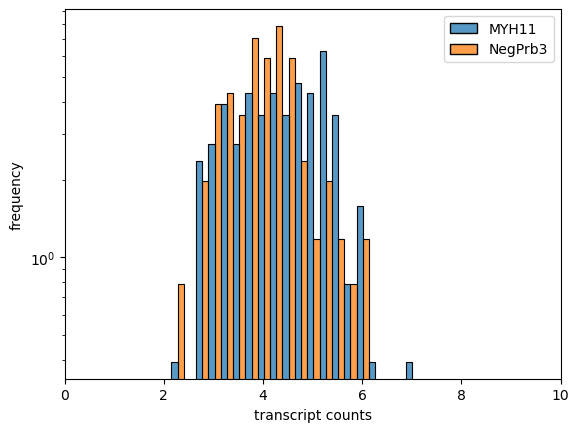

In [409]:
# Nanostring dataset
# set_plotting_style()
# plt.rc('figure', figsize=[8,6])

# convert to a dataframe for plotting
df_nanostring = pd.DataFrame(y.layers['log_normalized_counts'].toarray(),
                                       index = y.obs_names,
                                       columns = y.var_names)

list_markers = [marker_genes['Fibroblast'][0],'NegPrb3'] # neat1
#list_markers = markers_genes['Fibroblast']

ax = sns.histplot(df_nanostring.loc[:,list_markers], stat='percent', bins=20, multiple = 'dodge')

ax.set_xlabel('transcript counts')
ax.set_ylabel('frequency')
ax.set_xlim((0,10))
ax.set_yscale('log')
plt.show()

#scatter plot between neg probe and marker gene for each cell 

In [410]:
myh11_counts = ndata.layers['raw_counts'][:,ndata.var_names =='MYH11']
x = ndata[myh11_counts>0]
negprobe3counts = x.layers['raw_counts'][:,x.var_names == 'NegPrb3']
y = x[negprobe3counts > 0]
y

View of AnnData object with n_obs × n_vars = 127 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ercc', 'pct_counts_ercc', 'n_genes', 'Endoscopic_severity', 'R_vs_L', 'leiden_v10_r1.6', 'Patient_samples', 'leiden_v8_r1.6', 'fine_annotation', 'Coarse_annotation', 'leiden_v9_r0.4', 'Condition'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ercc', 'n_cells', 'mean', 'std'
    uns: 'Coarse_annotation_colors', 'fov_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_spatial', 'X_spatial_global', 'X_umap', 'spatial', 'spatial_fov'
    varm: 'PCs'
    layers: 'log_normalized_counts', 'raw_counts', 'scale_data'
    obsp: 'connect

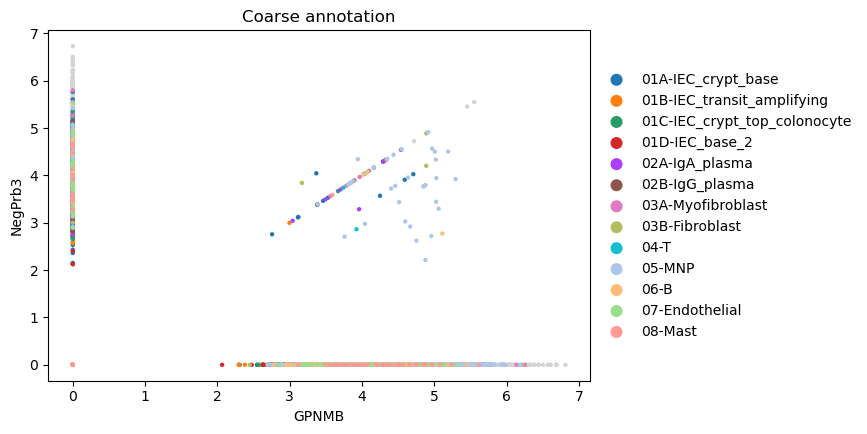

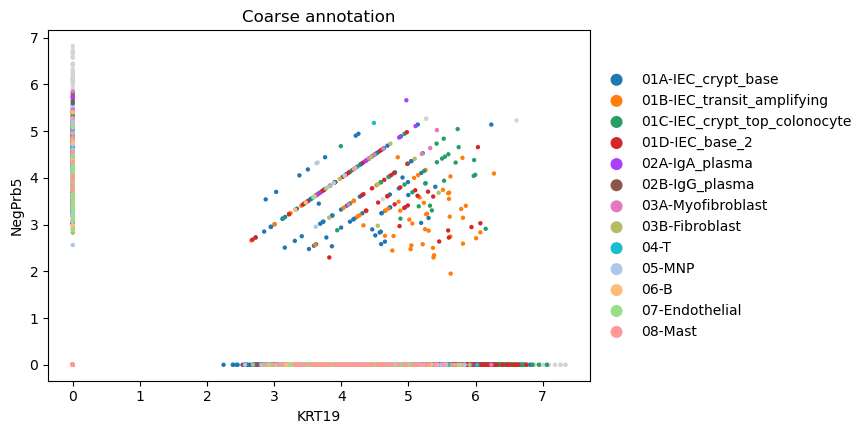

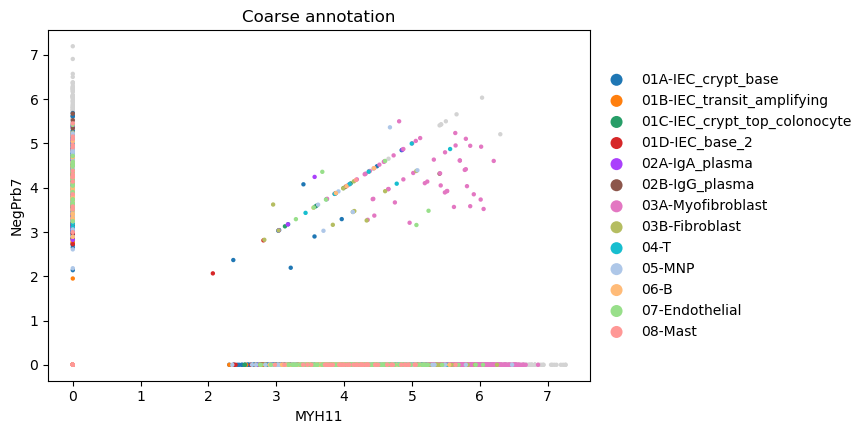

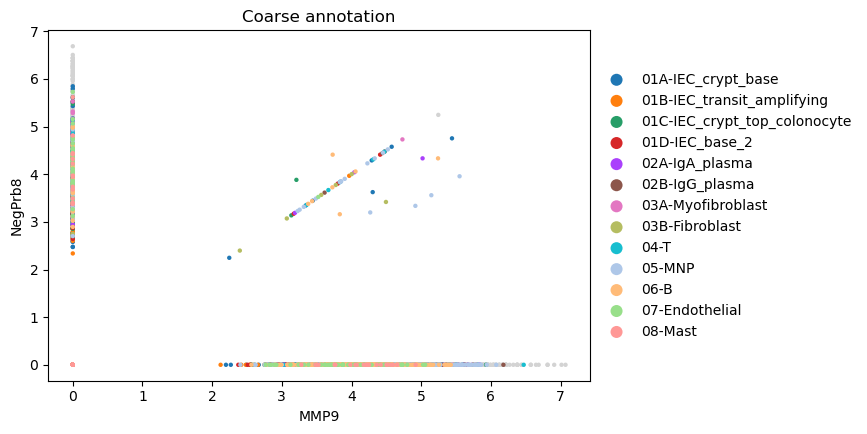

In [411]:
#scatter plot between neg probe and marker gene for each cell 

sc.pl.scatter(ndata,x='GPNMB',y='NegPrb3',color = 'Coarse_annotation',use_raw=False,layers='log_normalized_counts',size = 40)
sc.pl.scatter(ndata,x='KRT19',y='NegPrb5',color = 'Coarse_annotation',use_raw=False,layers='log_normalized_counts',size = 40)
sc.pl.scatter(ndata,x='MYH11',y='NegPrb7',color = 'Coarse_annotation',use_raw=False,layers='log_normalized_counts',size = 40)
sc.pl.scatter(ndata,x='MMP9',y='NegPrb8',color = 'Coarse_annotation',use_raw=False,layers='log_normalized_counts',size = 40)

#scatter plot between neg probe and marker gene for each cell 

In [412]:
#make a giant marker gene that's just negative counts for each cell
negprobes
cellcount_negprobes = ndata.layers['raw_counts'][:,ndata.var_names.isin(negprobes)].toarray().sum(axis=1)
len(cellcount_negprobes[cellcount_negprobes == 0])
ndata_small = ndata[cellcount_negprobes==0]

ndata_withnegprobes = ndata[cellcount_negprobes > 0]
#might be worth subsetting to only cells with 0 negative probe counts (34818)

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


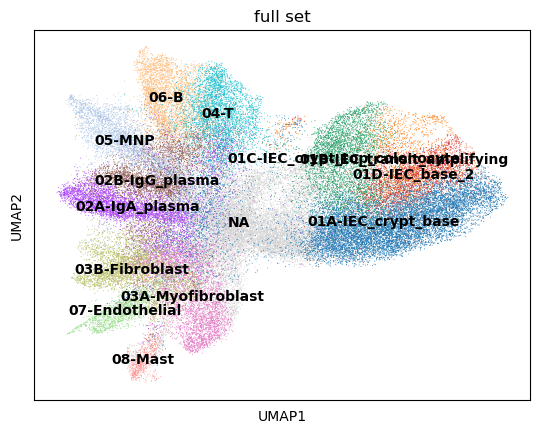

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


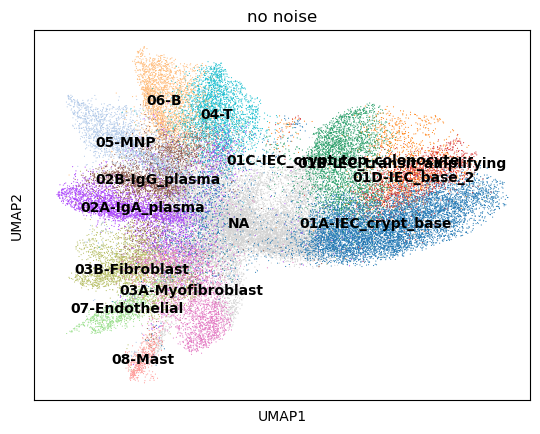

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


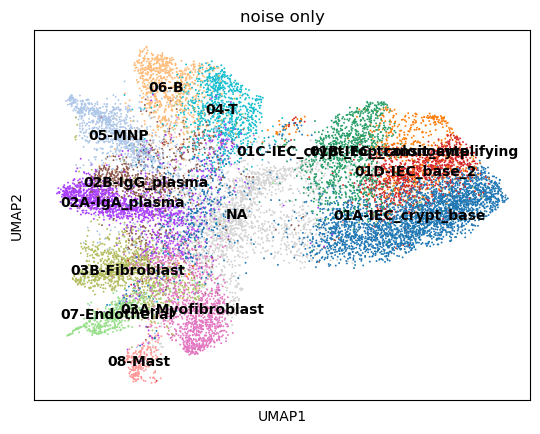

In [413]:
sc.pl.umap(ndata,color = 'Coarse_annotation',legend_loc='on data',title='full set')
sc.pl.umap(ndata_small,color = 'Coarse_annotation',legend_loc='on data',title='no noise')
sc.pl.umap(ndata_withnegprobes,color = 'Coarse_annotation',legend_loc='on data',title = 'noise only')

In [414]:
#spatial distribution of noisy cells? 

#spatial plots of differentially expressed genes

#done #subset to only genes that are substantially higher than the negative probes
#IL1B - not present at all

#look at the spatial correlation between different cell types within ~50 um or so instead of over the full fov (maybe surrounding each crypt)
#(activated macrophages vs activated fibroblasts)
#overlay between control and UC, average over each fov



/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


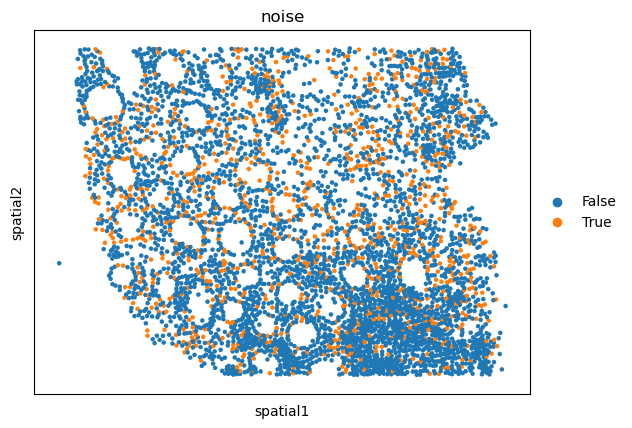

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


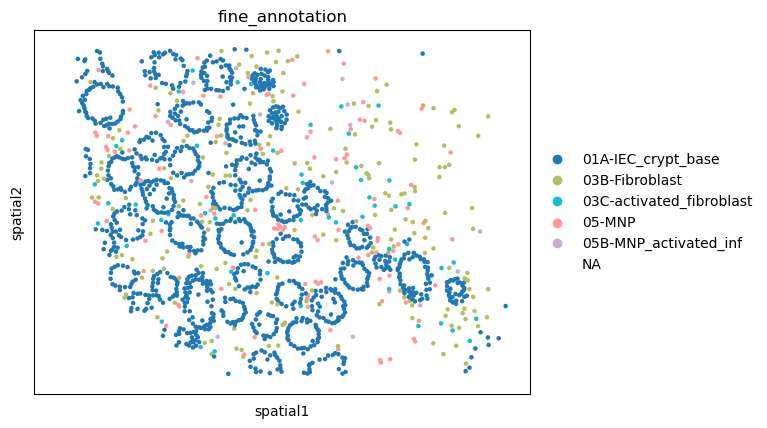

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


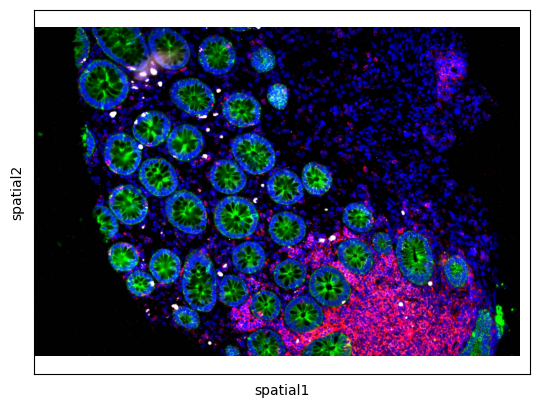

In [415]:
#print some spatial plots of the noisy cells
cell_barcodes_noise = ndata_withnegprobes.obs.index
cell_barcodes_nonoise = ndata_small.obs.index

#a if C else b for i in items
ndata.obs['noise']=['True' if i in cell_barcodes_noise else 'False' for i in ndata.obs.index]

# Check if the raw staining images are also loaded - This needs to be explored further to see what we'd like to visualize)
sc.pl.spatial(ndata[ndata.obs.fov=='1'], color=['noise'],
              alpha_img=0, library_id="1", spot_size=50) # 1st field of view

sc.pl.spatial(ndata[ndata.obs.fov=='1'], color=['fine_annotation'],groups = ['03B-Fibroblast','01A-IEC_crypt_base','05-MNP','03C-activated_fibroblast','05B-MNP_activated_inf'],
              alpha_img=0, library_id="1", spot_size=50) # 1st field of view

sc.pl.spatial(ndata[ndata.obs.fov=='1'], 
              alpha_img=1, library_id="1", spot_size=50) # 1st field of view

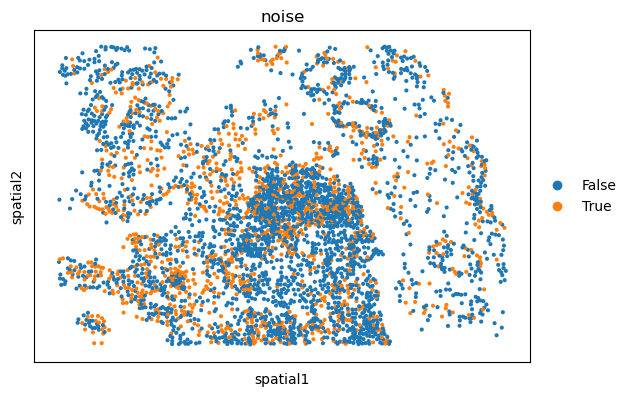

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


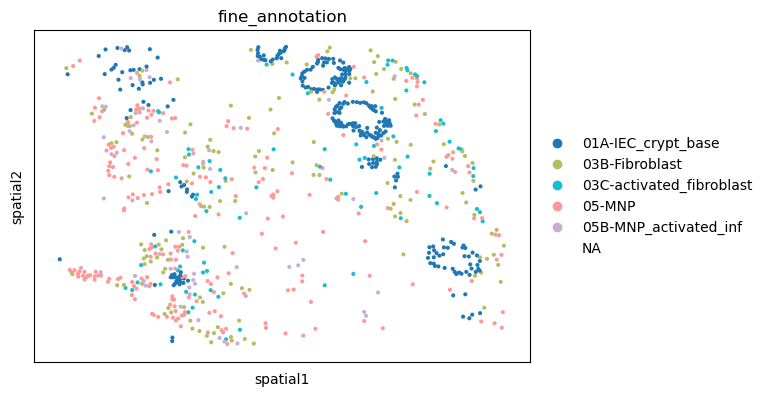

In [416]:
sc.pl.spatial(ndata[ndata.obs.fov=='3'], color=['noise'],
              alpha_img=0, library_id="3", spot_size=50) # 1st field of view

sc.pl.spatial(ndata[ndata.obs.fov=='3'], color=['fine_annotation'],groups = ['03B-Fibroblast','01A-IEC_crypt_base','05-MNP','03C-activated_fibroblast','05B-MNP_activated_inf'],
              alpha_img=0, library_id="3", spot_size=50) # 1st field of view

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


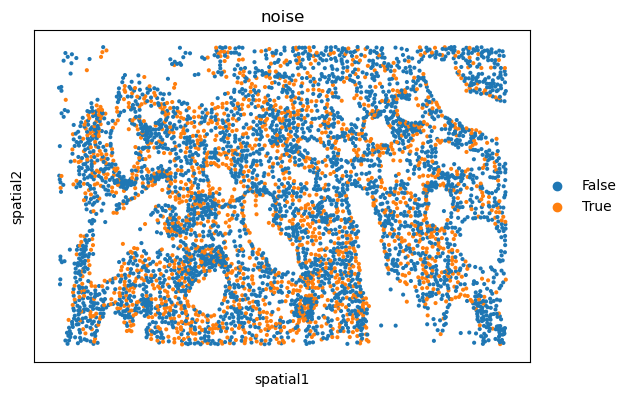

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


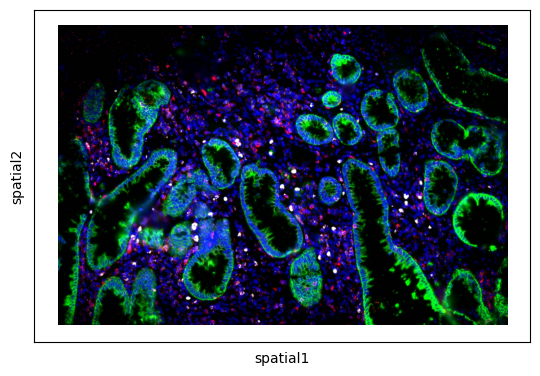

In [417]:
sc.pl.spatial(ndata[ndata.obs.fov=='4'], color=['noise'],
              alpha_img=0, library_id="4", spot_size=50) # 1st field of view

sc.pl.spatial(ndata[ndata.obs.fov=='4'],
              alpha_img=1, library_id="4", spot_size=50) # 1st field of view



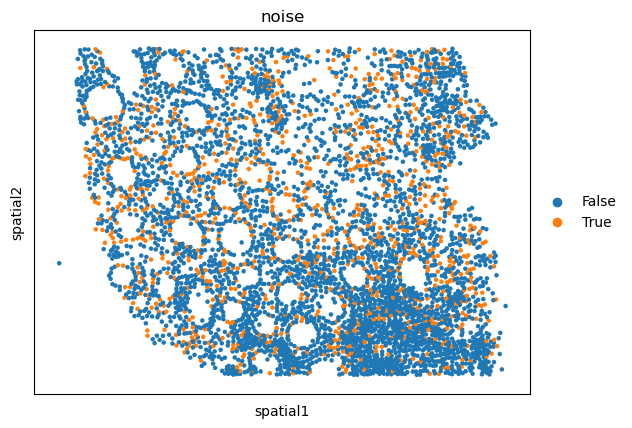

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


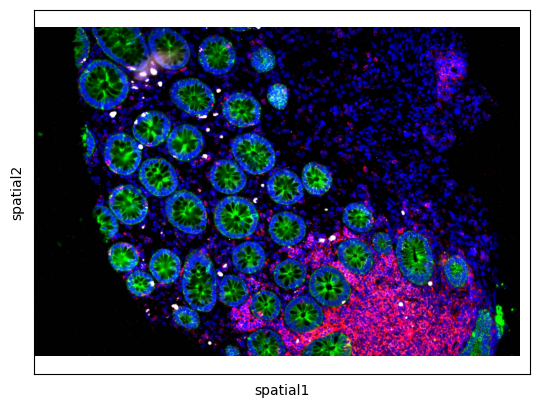

In [418]:
sc.pl.spatial(ndata[ndata.obs.fov=='1'], color=['noise'],
              alpha_img=0, library_id="1", spot_size=50,use_raw = False) # 1st field of view

sc.pl.spatial(ndata[ndata.obs.fov=='1'],
              alpha_img=1, library_id="1", spot_size=50,use_raw = False) # 1st field of vie

In [419]:
#1: Subset genes to those that are substantially (2x) higher in the total dataset than the negative probes
min = 10**array_neg.max()
print(min)
keep_genes = array_pos[10**array_pos > min*2].index
keep_genes

1622.0


Index(['ABL1', 'ACE2', 'ACTA2', 'ACTG2', 'ACVR1B', 'ACVRL1', 'ADGRA2',
       'ADGRA3', 'ADGRE5', 'ADGRG1',
       ...
       'VHL', 'VIM', 'VSIR', 'WIF1', 'WNT5B', 'WNT7B', 'XBP1', 'YBX3', 'YES1',
       'ZFP36'],
      dtype='object', length=625)

In [430]:
#subset ndata
ndata = ndata[:,ndata.var.index.isin(keep_genes)].copy()
ndata = ndata[~ndata.obs.Condition.isna()].copy()

print(ndata)
#write to an h5ad
ndata.write_h5ad('/mnt/ibm_lg/leah.dorman/Nanostring/Data/IBD_Michael_Kattah/processed_data/nanostring_IBD_normalized_umap_subset_2xERCC_12522.h5ad')

                     

AnnData object with n_obs × n_vars = 48783 × 625
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.CD45', 'Max.CD45', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ercc', 'pct_counts_ercc', 'n_genes', 'Endoscopic_severity', 'R_vs_L', 'leiden_v10_r1.6', 'Patient_samples', 'leiden_v8_r1.6', 'fine_annotation', 'Coarse_annotation', 'leiden_v9_r0.4', 'Condition', 'noise'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'ercc', 'n_cells', 'mean', 'std'
    uns: 'Coarse_annotation_colors', 'fov_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_spatial', 'X_spatial_global', 'X_umap', 'spatial', 'spatial_fov'
    varm: 'PCs'
    layers: 'log_normalized_counts', 'raw_counts', 'scale_data'
    obsp: 'conn

In [431]:
all_fov = sorted(set(ndata.obs.fov))
annotation_col = 'fine_annotation'
celltype_1 = '05B-MNP_activated_inf'
celltypes_to_compare = ['01A-IEC_crypt_base','03B-Fibroblast','05-MNP','03C-activated_fibroblast','05B-MNP_activated_inf',]
data_frame_total = pd.DataFrame()

  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/squidpy/gr/_nhood.py:182: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/squidpy/gr/_nhood.py:182: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


  0%|          | 0/1000 [00:00<?, ?/s]

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/squidpy/gr/_nhood.py:182: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/squidpy/gr/_nhood.py:182: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)
/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/squidpy/pl/_utils.py:545: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(constrained_layout=True, dpi=dpi, figsize=figsize)


  0%|          | 0/1000 [00:00<?, ?/s]

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/squidpy/gr/_nhood.py:182: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

/home/leah.dorman/anaconda3/envs/anno/lib/python3.8/site-packages/squidpy/gr/_nhood.py:182: RuntimeWarning: invalid value encountered in divide
  zscore = (count - perms.mean(axis=0)) / perms.std(axis=0)


  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

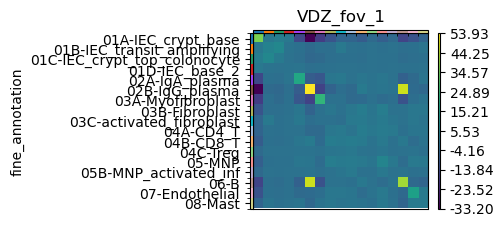

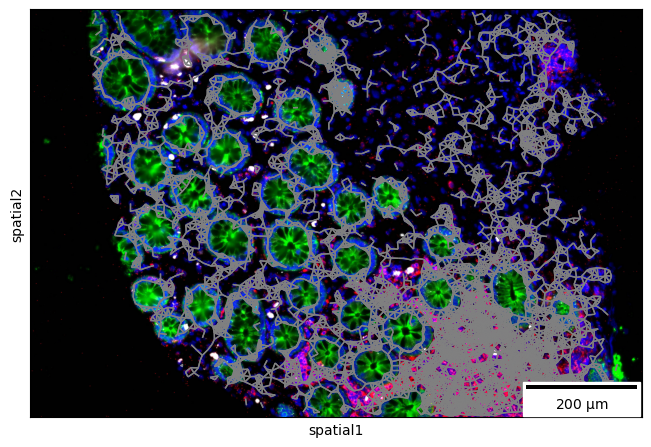

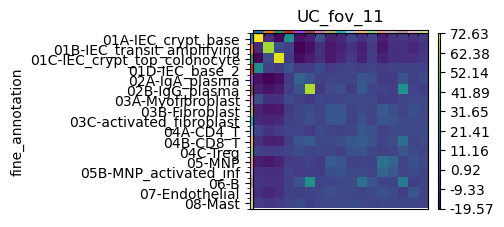

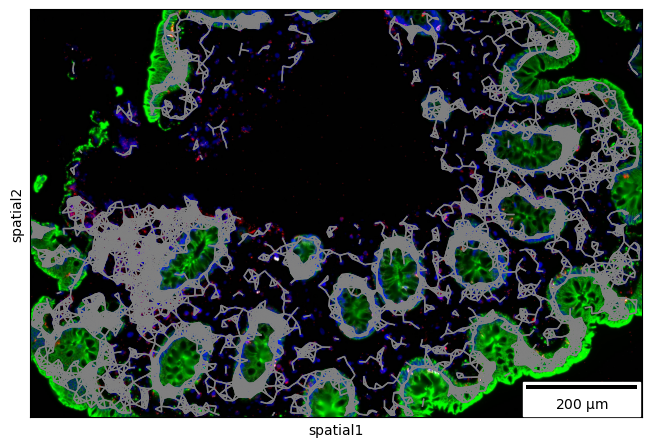

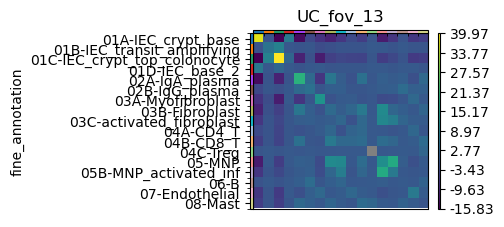

...

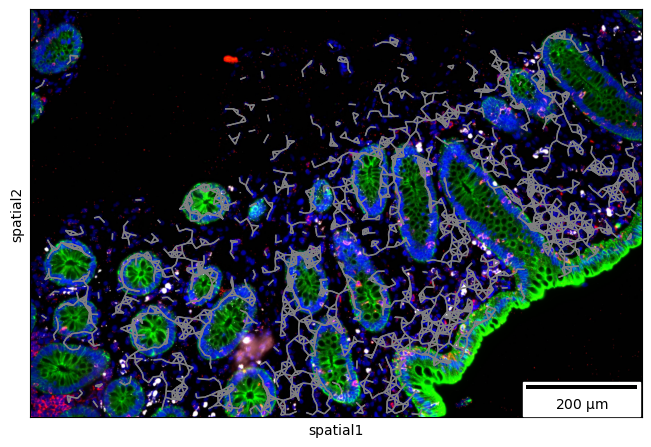

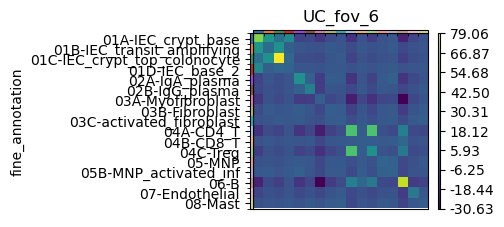

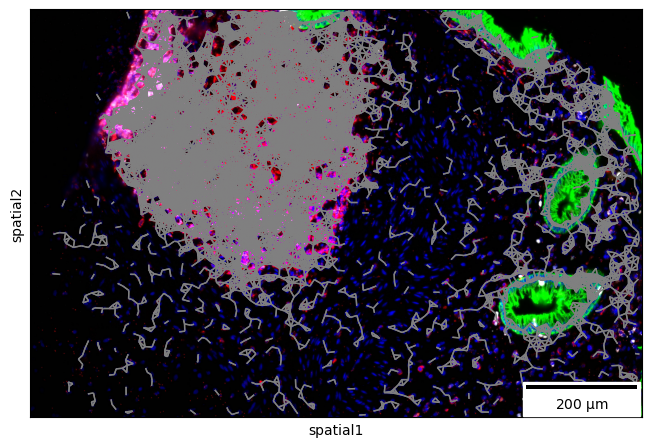

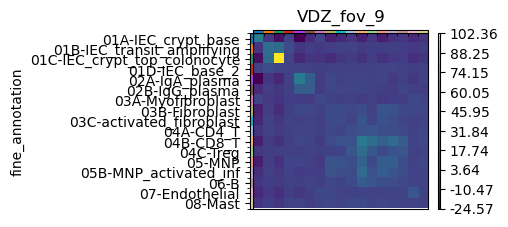

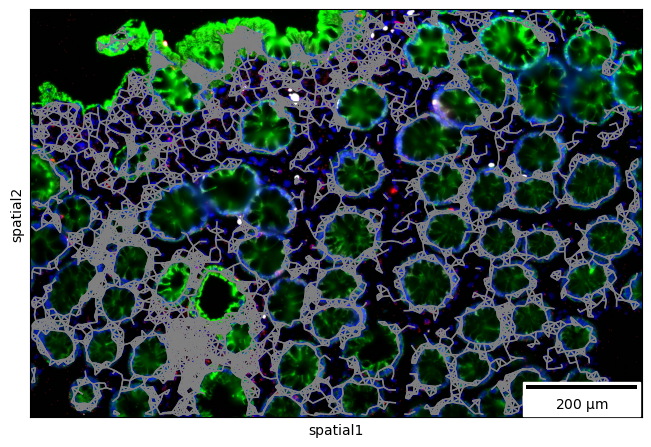

In [435]:
for region in all_fov:
    #split the object by fov
    adata = ndata[ndata.obs.fov==region].copy()
    
    #find the condition
    condition = list(set(adata.obs.Condition))[0]
    
    #build a column name
    col_name = condition+'_fov_'+region+'_vs_'+celltype_1
    
    #calculate neighborhood graph
    sq.gr.spatial_neighbors(adata,coord_type = 'generic',radius = 75)
    sq.gr.nhood_enrichment(adata, cluster_key=annotation_col)
    sq.pl.nhood_enrichment(adata, cluster_key=annotation_col,title = condition+'_fov_'+region,figsize=[2,2])
    nbhd_enrichment = adata.uns[annotation_col+'_nhood_enrichment']['zscore']
    sq.pl.spatial_scatter(adata, connectivity_key="spatial_connectivities", img=True, img_alpha=1,na_color="lightgrey",library_id = region,scalebar_dx=0.2, scalebar_kwargs={"scale_loc": "bottom", "location": "lower right"})

    #build a data frame
    df = pd.DataFrame(nbhd_enrichment)
    df.columns = sorted(set(adata.obs[annotation_col]))
    df.index = sorted(set(adata.obs[annotation_col]))
    
    #pull out celltypes of interest
    df = df.loc[celltypes_to_compare,celltype_1]
    
    #add to data_frame_total
    data_frame_total[col_name] = df


In [438]:
data_frame_total = data_frame_total.sort_index(axis=1)
data_frame_total.to_csv('/mnt/ibm_lg/leah.dorman/Nanostring/Data/fine_neighborhood_enrichment_vs_activatedMNP_sub_12522.csv')
!rclone copy /mnt/ibm_lg/leah.dorman/Nanostring/Data/fine_neighborhood_enrichment_vs_activatedMNP_sub_12522.csv gdrive:Nanostring/Spreadsheets/

In [437]:
data_frame_total = data_frame_total.sort_index(axis=1)
data_frame_total

,HC_fov_14_vs_05B-MNP_activated_inf,HC_fov_15_vs_05B-MNP_activated_inf,HC_fov_16_vs_05B-MNP_activated_inf,HC_fov_17_vs_05B-MNP_activated_inf,HC_fov_18_vs_05B-MNP_activated_inf,HC_fov_19_vs_05B-MNP_activated_inf,HC_fov_20_vs_05B-MNP_activated_inf,HC_fov_21_vs_05B-MNP_activated_inf,UC_fov_11_vs_05B-MNP_activated_inf,UC_fov_13_vs_05B-MNP_activated_inf,UC_fov_5_vs_05B-MNP_activated_inf,UC_fov_6_vs_05B-MNP_activated_inf,VDZ_fov_1_vs_05B-MNP_activated_inf,VDZ_fov_2_vs_05B-MNP_activated_inf,VDZ_fov_3_vs_05B-MNP_activated_inf,VDZ_fov_4_vs_05B-MNP_activated_inf,VDZ_fov_9_vs_05B-MNP_activated_inf
01A-IEC_crypt_base,-6.587978,-2.193126,-1.871331,-3.213295,-2.377648,-3.349299,-3.263623,-5.964326,-6.507820,-6.907949,-2.718388,-0.967791,-3.421509,0.620327,-2.383240,-4.090767,-6.733634
03B-Fibroblast,2.981253,-0.083475,-0.666342,0.054793,0.219602,-0.067923,2.936256,6.062100,3.055571,2.499144,1.713026,0.092851,-0.325767,1.959177,0.883689,2.657185,6.905393
05-MNP,11.407105,3.939232,2.552573,0.968676,10.696457,3.197456,7.605277,19.448394,10.806189,18.277471,4.318213,3.251568,1.525020,3.304580,3.265199,3.689120,13.272963
03C-activated_fibroblast,2.336191,-1.380006,-0.273025,-0.877482,1.005485,2.322940,2.429075,2.157003,4.230058,7.868866,2.662353,0.409814,0.795496,1.782327,-1.180451,-0.178951,5.250579
05B-MNP_activated_inf,0.576397,2.790921,-0.808133,-0.432202,3.933383,3.785983,0.855889,7.569441,6.332482,6.645066,0.887289,3.911736,-0.458991,3.038261,1.644654,-0.807964,8.903827
